# reading HDF5 data file and understanding the dataset structure

In [2]:
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf


2025-07-16 08:46:11.597412: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752669971.624747    4810 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752669971.631379    4810 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-07-16 08:46:11.723810: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
path = '/home/suraj/Data/Duke_WLOA_RL_Annotated/Duke_WLOA_Control_processed.h5'

In [4]:
f = h5py.File(path, 'r')
f.keys()

<KeysViewHDF5 ['images', 'layer_maps', 'layer_names', 'splits']>

In [5]:
images = f['images']
layers = f['layer_maps']
splits = f['splits']
names = f['layer_names']
images, layers, splits, names

(<HDF5 dataset "images": shape (5088, 224, 224), type "<f4">,
 <HDF5 dataset "layer_maps": shape (5088, 224, 3), type "<f4">,
 <HDF5 group "/splits" (3 members)>,
 <HDF5 dataset "layer_names": shape (3,), type "|S16">)

In [6]:
print("Min:", np.nanmin(layers), "Max:", np.nanmax(layers))
print("Unique values:", np.unique(layers))
print("Any NaNs?", np.isnan(layers).any())
print("Shape:", layers.shape)

Min: 10.453333 Max: 206.08
Unique values: [ 10.453333  10.826666  11.173333 ... 205.30666  205.33333  206.08    ]
Any NaNs? False
Shape: (5088, 224, 3)


In [15]:
def plot_bscan_with_layers(idx):
    """Plot B-scan with layer annotations"""
    # Get data
    image = f['images'][idx]
    layers = f['layer_maps'][idx]
    
    # Create figure
    plt.figure(figsize=(15, 5))
    
    # Plot B-scan
    plt.imshow(image, cmap='jet', aspect='auto')
    
    # Plot layer annotations
    x_coords = np.arange(224)
    colors = ['red', 'green', 'blue']
    layer_names = [name.decode() for name in f['layer_names']]
    
    for i, (color, name) in enumerate(zip(colors, layer_names)):
        plt.plot(x_coords, layers[:, i], color=color, label=name, linewidth=1)
    
    plt.title(f'B-scan {idx} with Layer Annotations')
    plt.legend(loc='upper right')
    plt.axis('on')
    plt.tight_layout()
    plt.show()

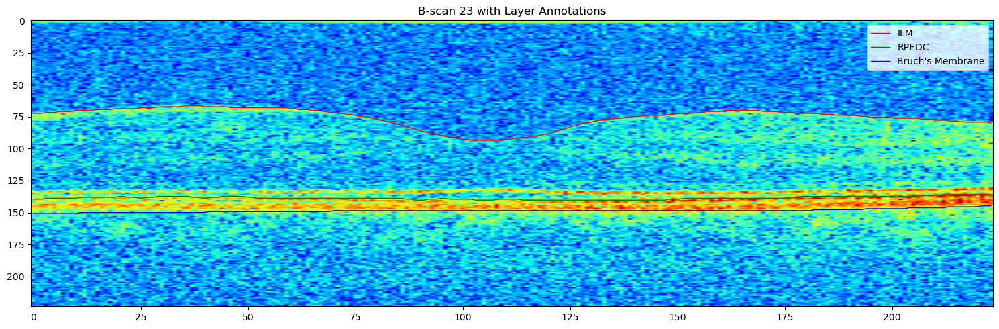

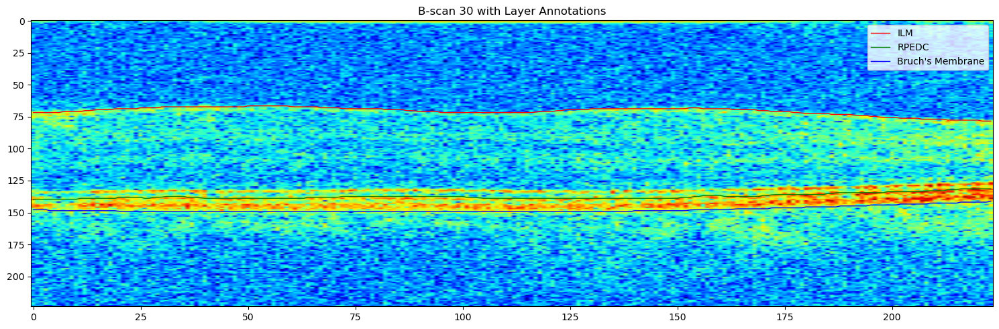

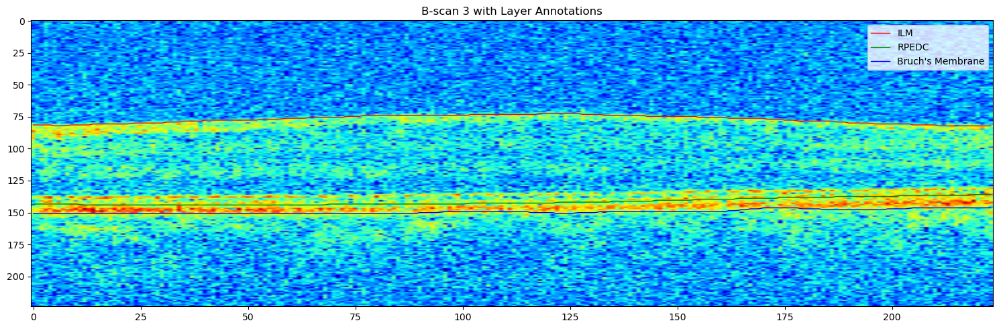

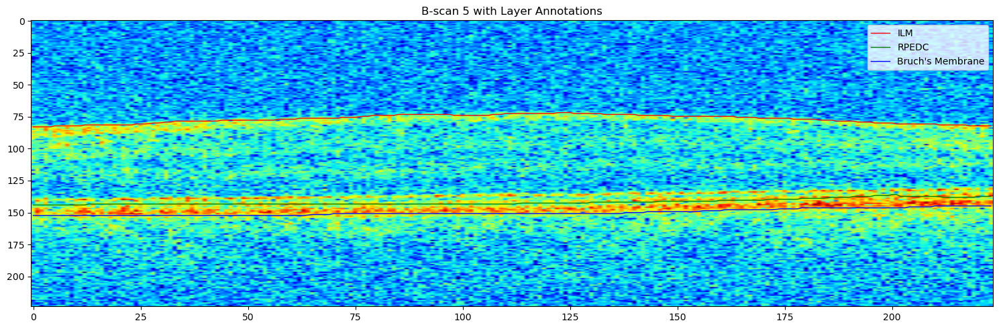

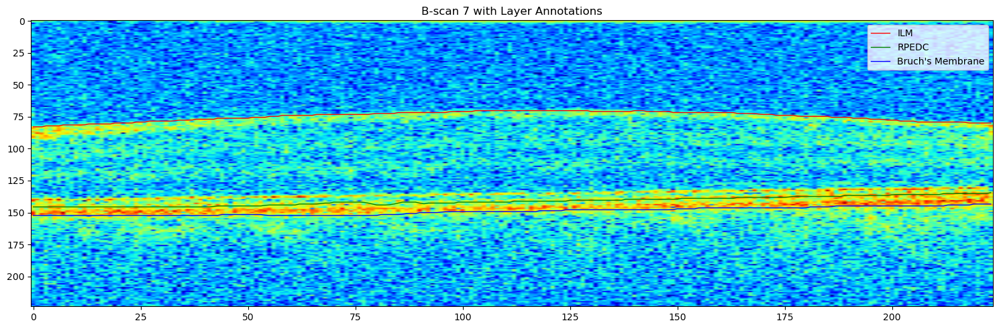

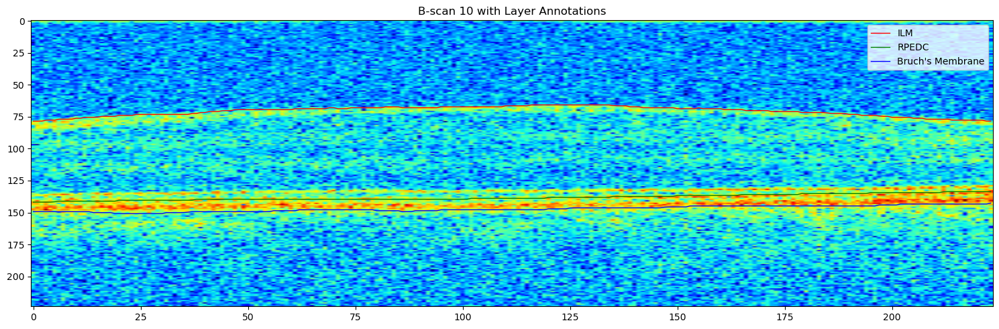

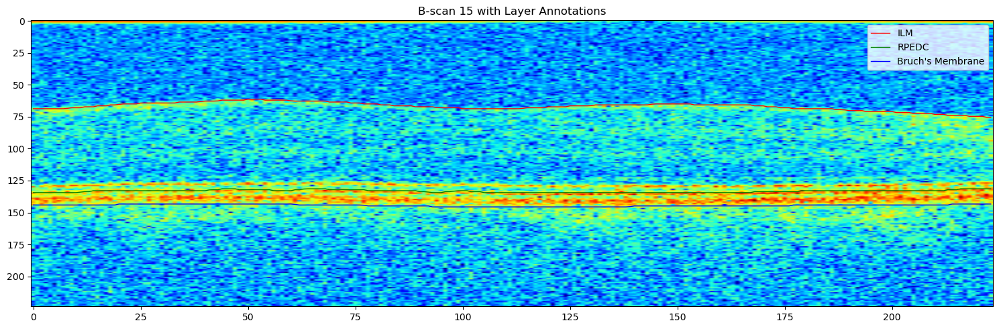

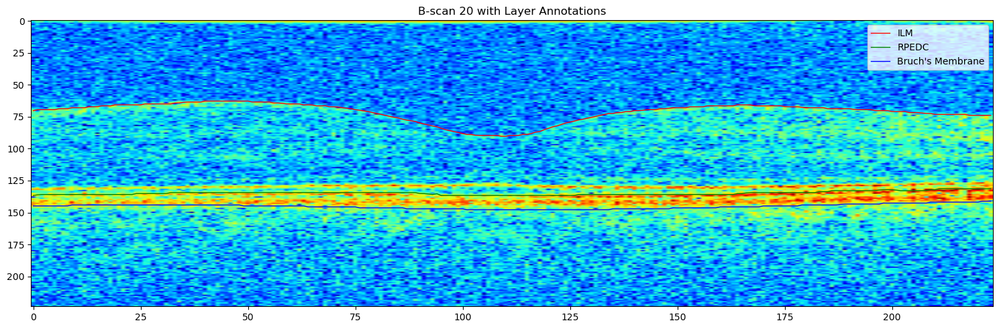

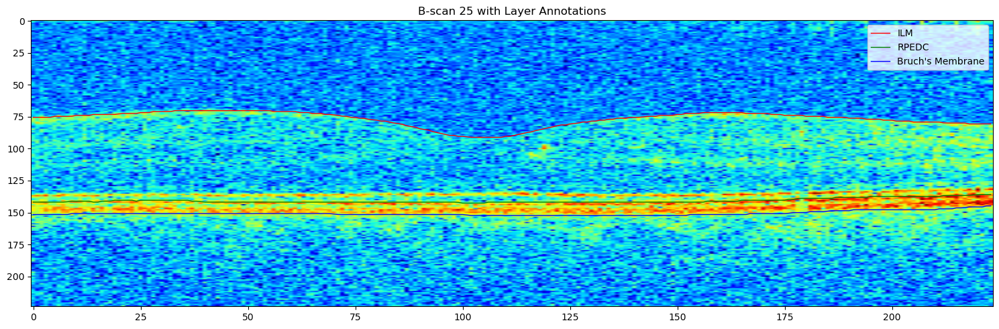

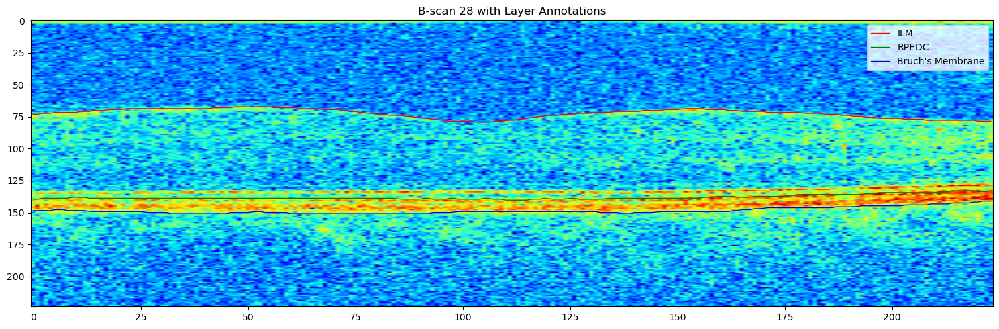

In [16]:

# Visualize a few examples
example_indices = [ 23, 30, 3, 5, 7, 10, 15, 20, 25, 28]  # Add more indices as needed
for idx in example_indices:
    plot_bscan_with_layers(idx)

# Image cropping and resizing


In [6]:
import cv2
from scipy import ndimage

def crop_image_with_layers(image, layers, target_height=300, target_width=600):
    """
    Crop image and layers based on layer annotations
    
    Args:
        image: B-scan image
        layers: layer annotations (1000, 3) - ILM, ONL, BM
        target_height: desired final height (300px)
        target_width: desired final width (600px)
    
    Returns:
        cropped_image: cropped image
        cropped_layers: cropped layer annotations
    """
    # Crop width: pixel 200 to 800 (600 pixels wide)
    width_start, width_end = 200, 800
    
    # Get layer boundaries
    # ILM is the first layer (index 0) - topmost boundary
    # BM is the last layer (index 2) - bottom boundary
    ilm_layer = layers[width_start:width_end, 0]  # First layer (ILM)
    bm_layer = layers[width_start:width_end, 2]   # Last layer (BM)
    
    # Remove NaN values and get valid boundaries
    valid_ilm = ilm_layer[~np.isnan(ilm_layer)]
    valid_bm = bm_layer[~np.isnan(bm_layer)]
    
    if len(valid_ilm) == 0 or len(valid_bm) == 0:
        print("Warning: No valid layer annotations found")
        # Fallback to center crop
        img_height = image.shape[0]
        height_start = max(0, img_height // 2 - target_height // 2)
        height_end = min(img_height, height_start + target_height)
    else:
        # Get top and bottom boundaries with padding
        top_boundary = int(np.nanmin(valid_ilm)) - 50  # ILM top + 50px padding
        bottom_boundary = int(np.nanmax(valid_bm)) + 50  # BM bottom + 50px padding
        
        # Ensure boundaries are within image limits
        top_boundary = max(0, top_boundary)
        bottom_boundary = min(image.shape[0], bottom_boundary)
        
        # Adjust to get exactly target_height pixels
        current_height = bottom_boundary - top_boundary
        
        if current_height > target_height:
            # If cropped region is larger than target, center the crop
            excess = current_height - target_height
            top_boundary += excess // 2
            bottom_boundary = top_boundary + target_height
        elif current_height < target_height:
            # If cropped region is smaller than target, expand equally
            deficit = target_height - current_height
            top_boundary = max(0, top_boundary - deficit // 2)
            bottom_boundary = min(image.shape[0], top_boundary + target_height)
            
            # If we hit image boundary, adjust the other side
            if bottom_boundary - top_boundary < target_height:
                if top_boundary == 0:
                    bottom_boundary = min(image.shape[0], target_height)
                else:
                    top_boundary = max(0, bottom_boundary - target_height)
        
        height_start, height_end = top_boundary, bottom_boundary
    
    # Crop the image
    cropped_image = image[height_start:height_end, width_start:width_end]
    
    # Crop and adjust the layer annotations
    cropped_layers = layers[width_start:width_end, :].copy()
    
    # Adjust layer y-coordinates to match cropped image
    for i in range(cropped_layers.shape[1]):
        valid_mask = ~np.isnan(cropped_layers[:, i])
        cropped_layers[valid_mask, i] -= height_start
        
        # Remove annotations that are now outside the cropped region
        out_of_bounds = (cropped_layers[:, i] < 0) | (cropped_layers[:, i] >= (height_end - height_start))
        cropped_layers[out_of_bounds, i] = np.nan
    
    return cropped_image, cropped_layers

In [7]:
def resize_and_normalize(image, layers, target_size=(224, 224)):
    """
    Resize image and layers to target size and normalize to [0,1]
    
    Args:
        image: cropped image
        layers: cropped layer annotations
        target_size: target size for transformer input (224, 224)
    
    Returns:
        resized_image: resized and normalized image
        resized_layers: resized layer annotations
    """
    # Resize image
    resized_image = cv2.resize(image, target_size, interpolation=cv2.INTER_LINEAR)
    
    # Normalize image to [0, 1]
    resized_image = resized_image.astype(np.float32)
    resized_image = (resized_image - resized_image.min()) / (resized_image.max() - resized_image.min() + 1e-8)
    
    # Resize layer annotations
    original_height, original_width = image.shape
    scale_y = target_size[1] / original_height  # height scaling
    scale_x = target_size[0] / original_width   # width scaling
    
    # Create new coordinate arrays for resized layers
    new_x_coords = np.arange(target_size[0])  # 224 points
    resized_layers = np.full((target_size[0], layers.shape[1]), np.nan)
    
    # Interpolate each layer to new size
    for layer_idx in range(layers.shape[1]):
        layer_data = layers[:, layer_idx]
        valid_mask = ~np.isnan(layer_data)
        
        if np.sum(valid_mask) > 1:  # Need at least 2 points for interpolation
            # Original x coordinates
            orig_x = np.arange(len(layer_data))[valid_mask]
            orig_y = layer_data[valid_mask]
            
            # Scale coordinates to new size
            scaled_x = orig_x * scale_x
            scaled_y = orig_y * scale_y
            
            # Interpolate to new x coordinates
            resized_layers[:, layer_idx] = np.interp(new_x_coords, scaled_x, scaled_y)
    
    return resized_image, resized_layers

In [14]:
def process_dataset(h5_file, output_path=None, save_processed=True):
    """
    Process entire dataset: crop, resize, and normalize all images and layers
    
    Args:
        h5_file: opened HDF5 file
        output_path: path to save processed data
        save_processed: whether to save the processed data
    
    Returns:
        processed_images: array of processed images (N, 224, 224)
        processed_layers: array of processed layer annotations (N, 224, 3)
        splits: original split information
    """
    images = h5_file['images']
    layers = h5_file['layer_maps']
    
    # Load splits data (it's a group, not a dataset)
    splits_data = {}
    for key in h5_file['splits'].keys():
        splits_data[key] = h5_file['splits'][key][:]
    
    num_images = images.shape[0]
    processed_images = np.zeros((num_images, 224, 224), dtype=np.float32)
    processed_layers = np.zeros((num_images, 224, 3), dtype=np.float32)
    
    print(f"Processing {num_images} images...")
    
    # Process each image
    for i in range(num_images):
        if i % 100 == 0:
            print(f"Processing image {i}/{num_images}")
        
        # Get original image and layers
        orig_image = images[i]
        orig_layers = layers[i]
        
        # Crop based on layer annotations
        cropped_img, cropped_layers = crop_image_with_layers(
            orig_image, orig_layers, target_height=300, target_width=600
        )
        
        # Resize and normalize for transformer input
        final_img, final_layers = resize_and_normalize(
            cropped_img, cropped_layers, target_size=(224, 224)
        )
        
        processed_images[i] = final_img
        processed_layers[i] = final_layers
    
    print("Processing complete!")
    
    if save_processed and output_path:
        print(f"Saving processed data to {output_path}")
        with h5py.File(output_path, 'w') as out_file:
            out_file.create_dataset('images', data=processed_images, compression='gzip')
            out_file.create_dataset('layer_maps', data=processed_layers, compression='gzip')
            
            # Save splits data as a group
            splits_group = out_file.create_group('splits')
            for key, value in splits_data.items():
                splits_group.create_dataset(key, data=value, compression='gzip')
            
            # Copy layer names if they exist
            if 'layer_names' in h5_file:
                out_file.create_dataset('layer_names', data=h5_file['layer_names'][:])
        
        print("Data saved successfully!")
    
    return processed_images, processed_layers, splits_data

In [9]:
def visualize_processing_steps(idx, h5_file):
    """
    Visualize the original, cropped, and final processed image for a given index
    """
    # Get original data
    orig_image = h5_file['images'][idx]
    orig_layers = h5_file['layer_maps'][idx]
    layer_names = [name.decode() for name in h5_file['layer_names']]
    
    # Process the image
    cropped_img, cropped_layers = crop_image_with_layers(
        orig_image, orig_layers, target_height=300, target_width=600
    )
    
    final_img, final_layers = resize_and_normalize(
        cropped_img, cropped_layers, target_size=(224, 224)
    )
    
    # Create visualization
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # Original image
    axes[0].imshow(orig_image, cmap='gray', aspect='auto')
    axes[0].set_title(f'Original Image {idx}\nSize: {orig_image.shape}')
    
    # Plot original layers
    x_coords = np.arange(1000)
    colors = ['red', 'green', 'blue']
    for i, (color, name) in enumerate(zip(colors, layer_names)):
        axes[0].plot(x_coords, orig_layers[:, i], color=color, label=name, linewidth=1)
    axes[0].legend(loc='upper right')
    axes[0].axvline(x=200, color='yellow', linestyle='--', alpha=0.7, label='Crop boundaries')
    axes[0].axvline(x=800, color='yellow', linestyle='--', alpha=0.7)
    
    # Cropped image
    axes[1].imshow(cropped_img, cmap='gray', aspect='auto')
    axes[1].set_title(f'Cropped Image\nSize: {cropped_img.shape}')
    
    # Plot cropped layers
    x_coords_cropped = np.arange(600)
    for i, (color, name) in enumerate(zip(colors, layer_names)):
        axes[1].plot(x_coords_cropped, cropped_layers[:, i], color=color, label=name, linewidth=1)
    axes[1].legend(loc='upper right')
    
    # Final processed image
    axes[2].imshow(final_img, cmap='gray', aspect='auto')
    axes[2].set_title(f'Final Processed Image\nSize: {final_img.shape}\nNormalized: [{final_img.min():.3f}, {final_img.max():.3f}]')
    
    # Plot final layers
    x_coords_final = np.arange(224)
    for i, (color, name) in enumerate(zip(colors, layer_names)):
        axes[2].plot(x_coords_final, final_layers[:, i], color=color, label=name, linewidth=1)
    axes[2].legend(loc='upper right')
    
    plt.tight_layout()
    plt.show()
    
    # Print processing statistics
    print(f"Processing Statistics for Image {idx}:")
    print(f"Original size: {orig_image.shape}")
    print(f"Cropped size: {cropped_img.shape}")
    print(f"Final size: {final_img.shape}")
    print(f"Original pixel range: [{orig_image.min()}, {orig_image.max()}]")
    print(f"Final pixel range: [{final_img.min():.3f}, {final_img.max():.3f}]")
    print("="*50)

In [ ]:
# Test the processing pipeline with a few examples
print("Testing image processing pipeline...")

# Visualize processing steps for a few sample images
test_indices = [23, 50, 100]

for idx in test_indices:
    visualize_processing_steps(idx, f)

In [ ]:
# Process the entire dataset
print("Processing entire dataset...")

# Define output path for processed data
output_path = '/home/suraj/Data/Duke_WLOA_RL_Annotated/Duke_WLOA_Control_processed.h5'

# Process all images
processed_images, processed_layers, splits = process_dataset(
    f, output_path=output_path, save_processed=True
)

print(f"Processed dataset shape:")
print(f"Images: {processed_images.shape}")
print(f"Layers: {processed_layers.shape}")
#print(f"Splits: {[(key, len(val)) for key, val in splits.items()]}")

Processing entire dataset...
Processing 5088 images...
Processing image 0/5088
Processing image 100/5088
Processing image 200/5088
Processing image 300/5088
Processing image 400/5088
Processing image 500/5088
Processing image 600/5088
Processing image 700/5088
Processing image 800/5088
Processing image 900/5088
Processing image 1000/5088
Processing image 1100/5088
Processing image 1200/5088
Processing image 1300/5088
Processing image 1400/5088
Processing image 1500/5088
Processing image 1600/5088
Processing image 1700/5088
Processing image 1800/5088
Processing image 1900/5088
Processing image 2000/5088
Processing image 2100/5088
Processing image 2200/5088
Processing image 2300/5088
Processing image 2400/5088
Processing image 2500/5088
Processing image 2600/5088
Processing image 2700/5088
Processing image 2800/5088
Processing image 2900/5088
Processing image 3000/5088
Processing image 3100/5088
Processing image 3200/5088
Processing image 3300/5088
Processing image 3400/5088
Processing i

AttributeError: 'dict' object has no attribute 'shape'

In [13]:
# Check the structure of splits data
print("Checking splits structure:")
print("Splits keys:", list(f['splits'].keys()))
for key in f['splits'].keys():
    print(f"  {key}: {f['splits'][key].shape}")

# Get all split data
splits_data = {}
for key in f['splits'].keys():
    splits_data[key] = f['splits'][key][:]
    
print("Splits data loaded successfully")

Checking splits structure:
Splits keys: ['test', 'train', 'val']
  test: (764,)
  train: (3561,)
  val: (763,)
Splits data loaded successfully


In [16]:
# Validation: Load and verify the processed data
print("Validating processed data...")

# Load the processed data
with h5py.File(output_path, 'r') as processed_file:
    loaded_images = processed_file['images'][:]
    loaded_layers = processed_file['layer_maps'][:]
    
    # Load splits data
    loaded_splits = {}
    for key in processed_file['splits'].keys():
        loaded_splits[key] = processed_file['splits'][key][:]
    
    print("Loaded processed data:")
    print(f"Images shape: {loaded_images.shape}")
    print(f"Images dtype: {loaded_images.dtype}")
    print(f"Images range: [{loaded_images.min():.3f}, {loaded_images.max():.3f}]")
    print(f"Layers shape: {loaded_layers.shape}")
    print(f"Layers dtype: {loaded_layers.dtype}")
    print(f"Splits: {[(key, len(val)) for key, val in loaded_splits.items()]}")
    
    # Check if all images are properly normalized
    print(f"\nNormalization check:")
    print(f"All images in [0,1] range: {np.all((loaded_images >= 0) & (loaded_images <= 1))}")
    print(f"Number of NaN values in images: {np.sum(np.isnan(loaded_images))}")
    print(f"Number of NaN values in layers: {np.sum(np.isnan(loaded_layers))}")

print("Processing and validation complete!")
print(f"Processed data saved to: {output_path}")
print("Ready for transformer model training!")

Validating processed data...
Loaded processed data:
Images shape: (5088, 224, 224)
Images dtype: float32
Images range: [0.000, 1.000]
Layers shape: (5088, 224, 3)
Layers dtype: float32
Splits: [('test', 764), ('train', 3561), ('val', 763)]

Normalization check:
All images in [0,1] range: True
Number of NaN values in images: 0
Number of NaN values in layers: 0
Processing and validation complete!
Processed data saved to: /home/suraj/Data/Duke_WLOA_RL_Annotated/Duke_WLOA_Control_processed.h5
Ready for transformer model training!


In [18]:
# Example: How to use the processed data for model training
print("Example usage of processed data:")
print("="*50)

# Load processed data
processed_path = '/home/suraj/Data/Duke_WLOA_RL_Annotated/Duke_WLOA_Control_processed.h5'

with h5py.File(processed_path, 'r') as data_file:
    # Get data splits (sort indices for HDF5 access)
    train_indices = np.sort(data_file['splits']['train'][:])
    val_indices = np.sort(data_file['splits']['val'][:])
    test_indices = np.sort(data_file['splits']['test'][:])
    
    # Load a batch of training data
    train_images = data_file['images'][train_indices[:10]]  # First 10 training images
    train_layers = data_file['layer_maps'][train_indices[:10]]  # Corresponding layer maps
    
    print(f"Training batch shape: {train_images.shape}")
    print(f"Training layers shape: {train_layers.shape}")
    print(f"Data ready for transformer input (224x224)")
    print(f"Images normalized to [0,1]: {train_images.min():.3f} - {train_images.max():.3f}")
    
    # The data is now ready for:
    # 1. PyTorch DataLoader
    # 2. TensorFlow Dataset
    # 3. Hugging Face transformers (Vision Transformer, SegFormer, etc.)
    
print("\n✅ Dataset processing complete!")
print("✅ All images cropped to 300x600, then resized to 224x224")
print("✅ Images normalized to [0,1] range")
print("✅ Layer annotations adjusted to match processed images")
print("✅ Data splits preserved")
print("✅ Ready for transformer model training!")

Example usage of processed data:
Training batch shape: (10, 224, 224)
Training layers shape: (10, 224, 3)
Data ready for transformer input (224x224)
Images normalized to [0,1]: 0.000 - 1.000

✅ Dataset processing complete!
✅ All images cropped to 300x600, then resized to 224x224
✅ Images normalized to [0,1] range
✅ Layer annotations adjusted to match processed images
✅ Data splits preserved
✅ Ready for transformer model training!


In [19]:
# Close the original file handle
f.close()
print("Original file handle closed.")

Original file handle closed.
